In [1]:
!pip install segmentation_models_pytorch

/bin/bash: /opt/conda/lib/libtinfo.so.6: no version information available (required by /bin/bash)
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 106.7/106.7 kB 816.2 kB/s eta 0:00:00
  Preparing metadata (setup.py) ... - done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 3.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... - done
  Created wheel for efficientnet-pytorch: filename=efficientnet_pytorch-0.7.1-py3-none-any.whl size=16446 sha256=122779936c68be5ad02773f1b1b45b1483a4d340569bd2295284dc229769cea0
  Stored in directory: /root/.cache/pip/wheels/0e/cc/b2/49e74588263573ff778da58cc99b9c6349b496636a7e165be6
  Created wheel for pretrainedmodels: filename=pretrainedmodels-0.7.4-py3-none-any.whl size=60965 sha256=9da92e24f4151020aaefac771c807aa93e01a169ae8b36417a173bfce7c848d6
  Stored in directory: /root/.cache/pip/wheels/ed/27/e8/9543d42de2740d3544db96aefef63bda3f2c1761b3334f4873
Successfully built efficientnet-pytorch pretrainedmodels


In [2]:
import os
import numpy as np
import pytorch_lightning as pl
import segmentation_models_pytorch as smp
import torch
from pathlib import Path
import albumentations as albu
from PIL import Image
import matplotlib.pyplot as plt
import wandb

In [3]:
from kaggle_secrets import UserSecretsClient
user_secrets = UserSecretsClient()
wandb_api_key= user_secrets.get_secret("segment_wandb_api")

In [4]:
wandb.login(key=wandb_api_key)

wandb: W&B API key is configured. Use `wandb login --relogin` to force relogin
wandb: WARNING If you're specifying your api key in code, ensure this code is not shared publicly.
wandb: WARNING Consider setting the WANDB_API_KEY environment variable, or running `wandb login` from the command line.
wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


True

In [5]:
class SegmentDataset(torch.utils.data.Dataset):
    def __init__(
        self,
        data_folder: Path = "binary_dataset",
        masks_folder: Path = "images_semantic",
        images_folder: Path = "original_images",
        split: str = "train",
        dataset_size: int = 300,
        transform: albu.augmentations.transforms = None,
    ):
        self._data_folder = data_folder
        self._masks_folder = os.path.join(data_folder, masks_folder)
        self._images_folder = os.path.join(data_folder, images_folder)
        
        if split == "train":
            self._masks_files = sorted(os.listdir(self._masks_folder))[:dataset_size]
            self._images_files = sorted(os.listdir(self._images_folder))[:dataset_size]

        elif split == "val":
            train_size = len(os.listdir(self._images_folder)) - (2 * dataset_size)
            val_size = train_size + dataset_size
            self._masks_files = sorted(os.listdir(self._masks_folder))[train_size:val_size]
            self._images_files = sorted(os.listdir(self._images_folder))[train_size:val_size]

        elif split == "test":
            test_size = len(os.listdir(self._images_folder)) - dataset_size
            self._masks_files = sorted(os.listdir(self._masks_folder))[test_size:]
            self._images_files = sorted(os.listdir(self._images_folder))[test_size:]
            
        self._transform = transform


    def __getitem__(self, idx):
        image_filename = self._images_files[idx]
        mask_filename = self._masks_files[idx]
        

        image = Image.open(os.path.join(self._images_folder, image_filename))
        mask = Image.open(os.path.join(self._masks_folder, mask_filename))
        
        image = np.array(image)
        mask = np.array(mask)
        
        batch = {"image": image, "mask": mask}

        if self._transform:
            batch = self._transform(image=image, mask=mask)
        
        batch = albu.Normalize()(image=batch["image"], mask=batch["mask"])

        return batch["image"].transpose(2, 0, 1), batch["mask"]

    def __len__(self):
        return len(self._images_files)

In [6]:
def visualize_masks(predicted_mask, true_mask, image):
    fig, ax = plt.subplots(1, 3, figsize=(15, 45))
    ax[0].imshow(true_mask)
    ax[1].imshow(predicted_mask)
    ax[2].imshow(image.permute(1, 2, 0))
    plt.show()

In [7]:
class SegmentModule(pl.LightningModule):
    def __init__(self, config):
        super().__init__()
        self._config = config
        self.model = MODELS[config["model_type"]](**config["model_params"])
        self.criterion = CRITERIONS[config["criterion_type"]]
        
    def train_dataset(self):
        params = self._config["dataset_train_params"]
        return SegmentDataset(split="train", **params)
    
    def val_dataset(self):
        params = self._config["dataset_val_params"]
        return SegmentDataset(split="val", **params)
    
    def test_dataset(self):
        params = self._config["dataset_test_params"]
        return SegmentDataset(split="test", **params)
        
    def train_dataloader(self):
        dataset = self.train_dataset()
        params = self._config["dataloader_params"]
        return torch.utils.data.DataLoader(dataset, shuffle=True,num_workers=2, **params)
        
    def val_dataloader(self):
        dataset = self.val_dataset()
        params = self._config["dataloader_params"]
        return torch.utils.data.DataLoader(dataset, shuffle=False,num_workers=2, **params)
        
    def test_dataloader(self):
        dataset = self.test_dataset()
        params = self._config["dataloader_params"]
        return torch.utils.data.DataLoader(dataset, shuffle=False,num_workers=2,**params)
        
    def training_step(self, batch, batch_idx):
        image, mask = batch
        predicted_heatmaps = self.model(image)
        loss = self.criterion(predicted_heatmaps, mask)
        predicted_masks = (predicted_heatmaps.sigmoid() >= 0.5).long().squeeze(1)
        tp, fp, fn, tn = smp.metrics.get_stats(predicted_masks, mask, mode="binary")
        iou = smp.metrics.iou_score(tp, fp, fn, tn, reduction="micro-imagewise")
        accuracy = smp.metrics.accuracy(tp, fp, fn, tn, reduction="micro")
        self.log("loss", loss)
        self.log("iou", iou)
        self.log("accuracy", accuracy)
        return {"loss": loss, "iou": iou, "accuracy": accuracy}
        
    def test_step(self, batch, batch_idx):
        image, mask = batch
        predicted_heatmaps = self.model(image)
        loss = self.criterion(predicted_heatmaps, mask)
        predicted_masks = (predicted_heatmaps.sigmoid() >= 0.5).long().squeeze(1)
        
        for sample in range(image.size(0)):
            visualize_masks(predicted_masks[sample].squeeze(0).detach().cpu(), 
                            mask[sample].squeeze(0).cpu(),
                            image[sample].detach().cpu(),
                           )
        
        tp, fp, fn, tn = smp.metrics.get_stats(predicted_masks, mask, mode="binary")
        iou = smp.metrics.iou_score(tp, fp, fn, tn, reduction="micro-imagewise")
        accuracy = smp.metrics.accuracy(tp, fp, fn, tn, reduction="micro")
        self.log("test_loss", loss)
        self.log("test_iou", iou)
        self.log("test_accuracy", accuracy)
        return {"test_loss": loss, "test_iou": iou, "test_accuracy": accuracy}
    
    def validation_step(self, batch, batch_idx):
        image, mask = batch
        predicted_heatmaps = self.model(image)
        loss = self.criterion(predicted_heatmaps, mask)
        predicted_masks = (predicted_heatmaps.sigmoid() >= 0.5).long().squeeze(1)
        tp, fp, fn, tn = smp.metrics.get_stats(predicted_masks, mask, mode="binary")
        iou = smp.metrics.iou_score(tp, fp, fn, tn, reduction="micro-imagewise")
        accuracy = smp.metrics.accuracy(tp, fp, fn, tn, reduction="micro")
        self.log("val_loss", loss)
        self.log("val_iou", iou)
        self.log("val_accuracy", accuracy)
        return {"val_loss": loss, "val_iou": iou, "val_accuracy": accuracy}
    
    def configure_optimizers(self):
        params = self._config["optimizer_params"]
        optimizer = OPTIMIZERS[config["optimizer_type"]](self.model.parameters(), **params)
        return optimizer

In [8]:
MODELS = {
    "Unet": smp.Unet,
}
CRITERIONS = {
    "Dice": smp.losses.DiceLoss(smp.losses.BINARY_MODE, from_logits=True),
    "SoftBCE": smp.losses.SoftBCEWithLogitsLoss,
}
OPTIMIZERS = {
    "Adam": torch.optim.Adam,
}

TRAIN_TRANSFORMS = albu.Compose([
    albu.Resize(736,736),
    albu.HorizontalFlip(p=0.5),
    albu.VerticalFlip(p=0.5),
    albu.RandomRotate90(p=0.5),
    albu.ElasticTransform(p=0.5, alpha=120, sigma=120 * 0.05, alpha_affine=120 * 0.03),
    albu.RandomBrightnessContrast(p=0.3),
])

TEST_TRANSFORMS = albu.Compose([albu.Resize(736,736)])

In [9]:
config = {
    "model_type": "Unet",
    "model_params": {
        "encoder_name": "resnet34",
        "encoder_weights": "imagenet",
        "in_channels": 3,
        "classes": 1,
    },
    "criterion_type": "Dice",
    "optimizer_type": "Adam",
    "optimizer_params": {
        "lr": 3e-5,
    },
    "dataloader_params": {
        "batch_size": 12,
    },
    "dataset_train_params":{
        "data_folder": "/kaggle/input/semantic-segmentation-drone-dataset/binary_dataset/binary_dataset",
        "masks_folder": "images_semantic",
        "images_folder": "original_images",
        "transform": TRAIN_TRANSFORMS,
        "dataset_size": 300,
    },
    "dataset_val_params":{
        "data_folder": "/kaggle/input/semantic-segmentation-drone-dataset/binary_dataset/binary_dataset",
        "masks_folder": "images_semantic",
        "images_folder": "original_images",
        "transform": TEST_TRANSFORMS,
        "dataset_size": 50,
    },
    "dataset_test_params":{
        "data_folder": "/kaggle/input/semantic-segmentation-drone-dataset/binary_dataset/binary_dataset",
        "masks_folder": "images_semantic",
        "images_folder": "original_images",
        "transform": TEST_TRANSFORMS,
        "dataset_size": 50,
    },
}

Downloading: "https://download.pytorch.org/models/resnet34-333f7ec4.pth" to /root/.cache/torch/hub/checkpoints/resnet34-333f7ec4.pth


  0%|          | 0.00/83.3M [00:00<?, ?B/s]

wandb: Currently logged in as: aleks_malakhov11. Use `wandb login --relogin` to force relogin


Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

/opt/conda/lib/python3.7/site-packages/pytorch_lightning/trainer/connectors/checkpoint_connector.py:128: UserWarning: `.test(ckpt_path=None)` was called without a model. The best model of the previous `fit` call will be used. You can pass `.test(ckpt_path='best')` to use the best model or `.test(ckpt_path='last')` to use the last model. If you pass a value, this warning will be silenced.
  + f" You can pass `.{fn}(ckpt_path='best')` to use the best model or"


Testing: 0it [00:00, ?it/s]

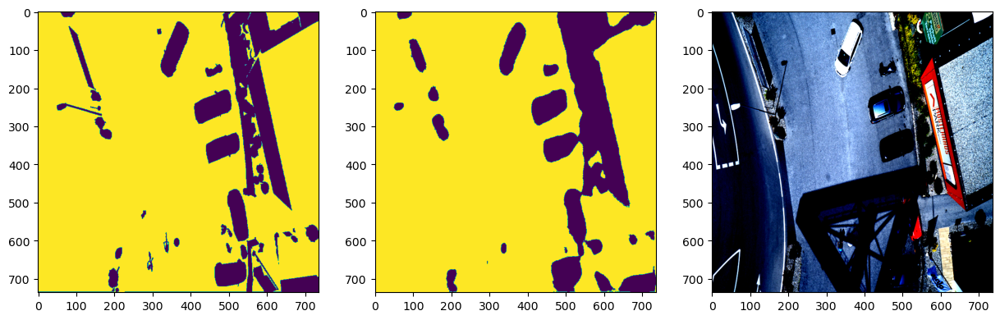

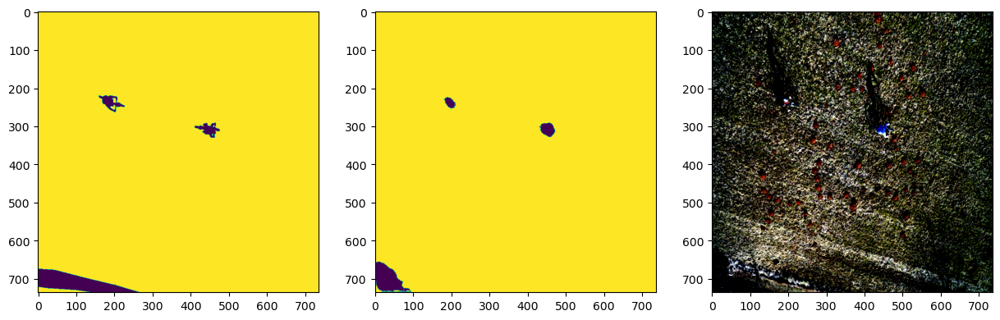

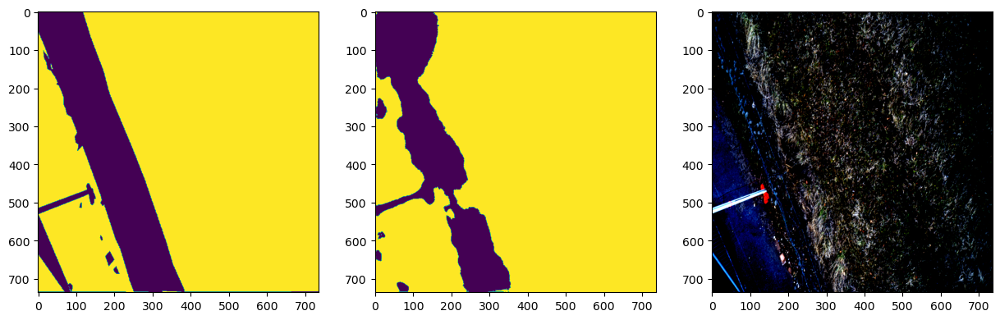

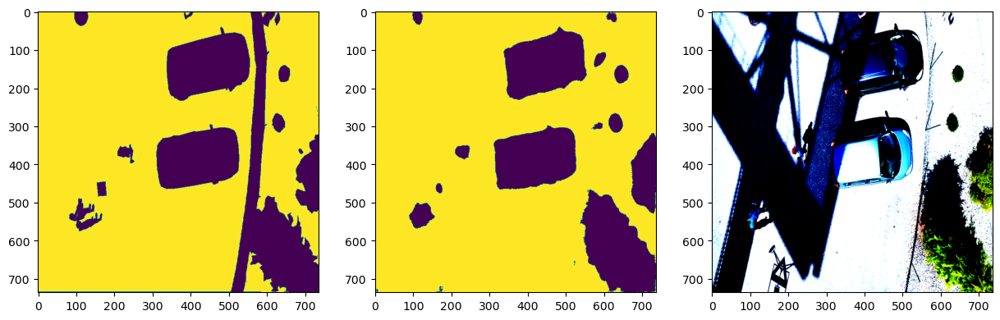

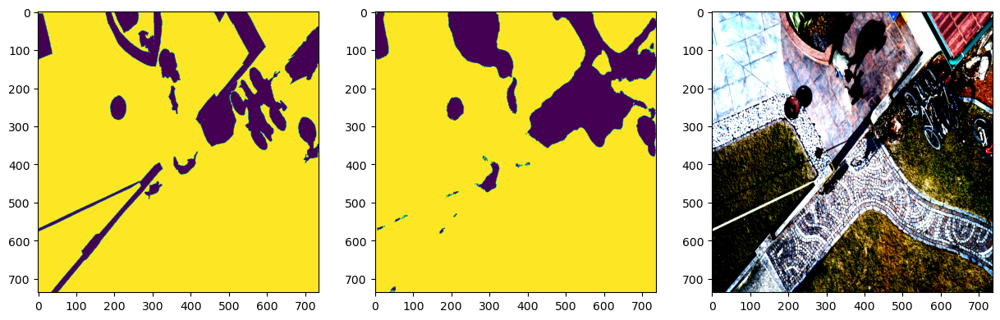

...

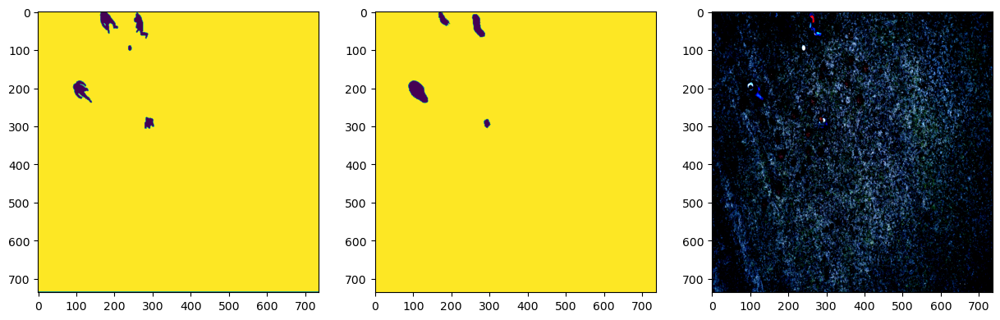

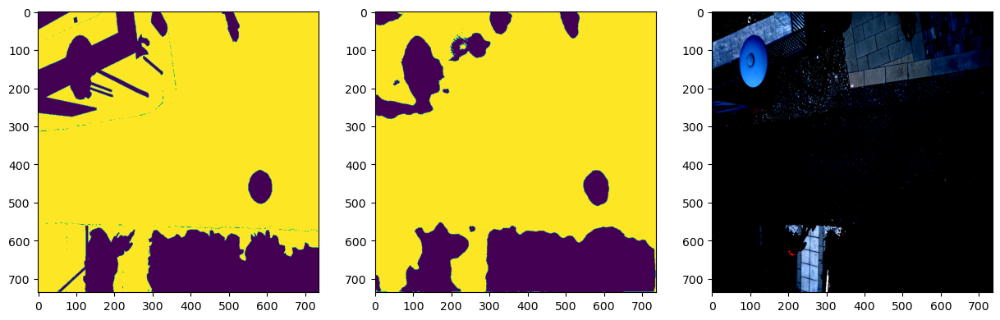

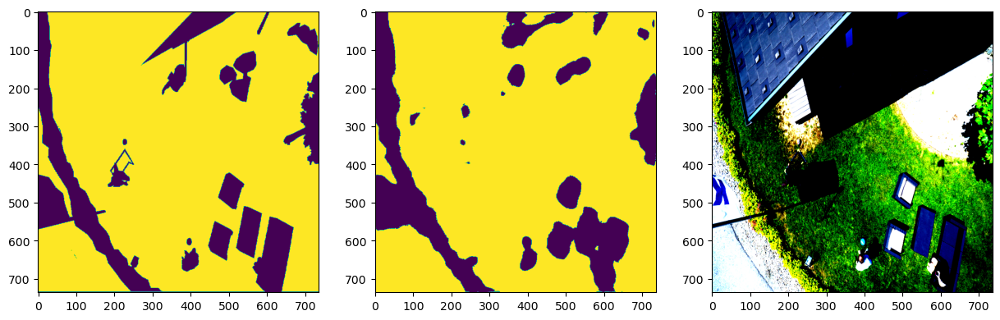

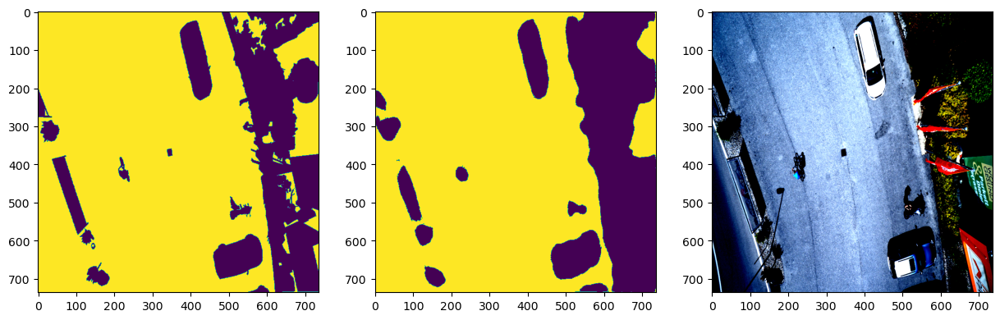

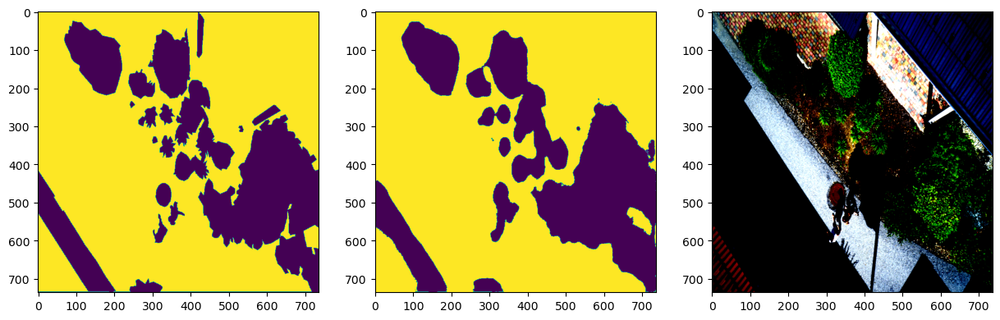

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│       test_accuracy       │    0.9294306039810181     │
│         test_iou          │    0.9020211696624756     │
│         test_loss         │    0.10060634464025497    │
└───────────────────────────┴───────────────────────────┘

[{'test_loss': 0.10060634464025497,
  'test_iou': 0.9020211696624756,
  'test_accuracy': 0.9294306039810181}]

In [10]:
module = SegmentModule(config)
logger = pl.loggers.WandbLogger(project="segment_kaggle", name="unet")
trainer = pl.Trainer(
    accelerator="gpu",
    logger=logger,
    log_every_n_steps=10,
    max_epochs=17,
    )
trainer.fit(module)
trainer.test()